# 1-D KRAKEN Demo

In [1]:
from pathlib import Path
import sys

from botorch.acquisition.analytic import ExpectedImprovement
import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm import tqdm

sys.path.insert(0, str(Path.cwd() / "Source"))

from BOGP.optimization.optimizer import Optimizer, OptimizerConfig
from BOGP.optimization.plotting import ResultsPlotter
from tritonoa.kraken import run_kraken
from tritonoa.io import read_ssp
from tritonoa.sp import beamformer, snrdb_to_sigma, added_wng

ROOT = Path("/Users/williamjenkins/Research/Projects/BOGP")

## Simulate received data

In [2]:
profile = "SWELLEX"
title = profile

### Define true environment, receiver & source parameters

In [3]:
# Set the true parameters:
range_true = 3.0
depth_true = 62
freq = 201

# Load CTD data
z_data, c_data, _ = read_ssp(ROOT / "Data" / "SWELLEX96" / "CTD" / "i9606.prn", 0, 3, header=None)
z_data = np.append(z_data, 217)
c_data = np.append(c_data, c_data[-1])

fixed_parameters = {
    # General
    "title": "SWELLEX96_SIM",
    "tmpdir": "tmp",
    "model": "KRAKENC",
    # Top medium
    # Layered media
    "layerdata": [
        {
            "z": z_data,
            "c_p": c_data,
            "rho": 1
        },
        {
            "z": [217, 240],
            "c_p": [1572.37, 1593.02],
            "rho": 1.8,
            "a_p": 0.3
        },
        {
            "z": [240, 1040],
            "c_p": [1881, 3245.8],
            "rho": 2.1,
            "a_p": 0.09
        }
    ],
    # Bottom medium
    "bot_opt": "A",
    "bot_c_p": 5200,
    "bot_rho": 2.7,
    "bot_a_p": 0.03,
    # Speed constraints
    "clow": 0,
    "chigh": 1600,
    # Receiver parameters
    "rec_z": np.linspace(94.125, 212.25, 64),
    "rec_r": range_true,
    # Source parameters
    "src_z": depth_true,
    "freq": freq
}

### Run Simulation

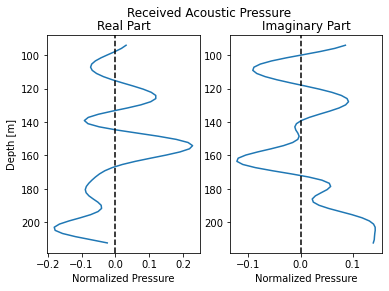

In [6]:
snr = np.Inf
sigma = snrdb_to_sigma(snr)

p_rec = run_kraken(fixed_parameters)
p_rec /= np.linalg.norm(p_rec)

noise = added_wng(p_rec.shape, sigma=sigma, cmplx=True)
p_rec += noise

K = p_rec.dot(p_rec.conj().T)

fig = plt.figure(figsize=(6, 4))

plt.subplot(1, 2, 1)
plt.plot(np.real(p_rec), fixed_parameters["rec_z"])
plt.gca().invert_yaxis()
plt.axvline(0, c="k", linestyle="--")
plt.xlabel(r"Normalized Pressure")
plt.ylabel("Depth [m]")
plt.title("Real Part")

plt.subplot(1, 2, 2)
plt.plot(np.imag(p_rec), fixed_parameters["rec_z"])
plt.gca().invert_yaxis()
plt.axvline(0, c="k", linestyle="--")
plt.xlabel(r"Normalized Pressure")
plt.title("Imaginary Part")

plt.suptitle("Received Acoustic Pressure")
plt.show()

## Estimate Range

### Define search space

In [4]:
[fixed_parameters.pop(item) for item in ["rec_r", "src_z"]]
search_parameters = [
    {
        "name": "rec_r",
        "bounds": [0.001, 10.0]
    },
    {
        "name": "src_z",
        "bounds": [0.5, 200.]
    }
]

### 2-D Matched Field Processing (MFP)

In [8]:
# Define search grid
dr = 1 / 1e3 # [km]
rvec = np.arange(search_parameters[0]["bounds"][0], search_parameters[0]["bounds"][1] + dr, dr)
zvec = np.arange(search_parameters[1]["bounds"][0], search_parameters[1]["bounds"][1], 1)

pbar = tqdm(
    zvec,
    bar_format='{l_bar}{bar:20}{r_bar}{bar:-20b}',
    desc="MFP",
    leave=True,
    position=0,
    unit=" step"
)
p_rep = np.zeros((len(zvec), len(rvec), len(fixed_parameters["rec_z"])))
B_bart = np.zeros((len(zvec), len(rvec)))

for zz, z in enumerate(pbar):
    p_rep = run_kraken(fixed_parameters | {"src_z": z, "rec_r": rvec})
    for rr, r in enumerate(rvec):
        B_bart[zz, rr] = beamformer(K, p_rep[:, rr], atype="cbf").item()

MFP: 100%|████████████████████| 200/200 [02:36<00:00,  1.28 step/s]


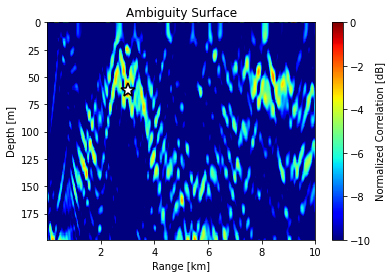

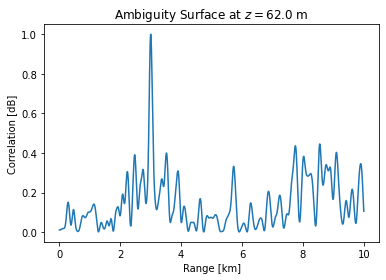

In [9]:
# Bn = B_bart / np.max(B_bart)
Bn = B_bart
logBn = 10 * np.log10(Bn)
src_z_ind, src_r_ind = np.unravel_index(np.argmax(logBn), (len(zvec), len(rvec)))

fig = plt.figure(figsize=(6, 4))
plt.imshow(
    logBn,
    aspect="auto",
    extent=[min(rvec), max(rvec), min(zvec), max(zvec)],
    origin="lower",
    vmin=-10, vmax=0, interpolation="none",
    cmap="jet"
)
plt.plot(rvec[src_r_ind], zvec[src_z_ind], 'w*', markersize=15, markeredgewidth=1.5, markeredgecolor="k")
plt.gca().invert_yaxis()
plt.xlabel("Range [km]")
plt.ylabel("Depth [m]")
plt.title("Ambiguity Surface")
plt.colorbar(label="Normalized Correlation [dB]")
plt.show()
# fig.savefig("/Users/williamjenkins/Desktop/ICA Figures/2D_amb.png", dpi=300, facecolor="white")

fig = plt.figure(figsize=(6, 4))
plt.plot(rvec, Bn[src_z_ind])
plt.xlabel("Range [km]")
plt.ylabel("Correlation [dB]")
plt.title(fr"Ambiguity Surface at $z={zvec[src_z_ind]}$ m")
plt.show()
# fig.savefig("/Users/williamjenkins/Desktop/ICA Figures/1D_amb.png", dpi=300, facecolor="white")

### BOGP: 1-D Range Estimation

In [5]:
search_parameters.pop(1)
fixed_parameters["src_z"] = depth_true

In [7]:
# Experiment settings
DATAROOT = ROOT / "Data" / "Demos" / "KRAKEN"
EXPERIMENT = "Experiment001"

# Optimization settings
N_SAMPLES = 512
N_WARMUP = 3
N_TOTAL = 200
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [10]:
class MatchedFieldProcessor:
    def __init__(self, atype="cbf"):
        self.atype = atype
        
    def __call__(self, parameters, scale=1):
        return self.evaluate_true(parameters)
    
    def __str__(self):
        return self.__class__.__name__
    
    def evaluate_true(self, parameters, scale=1):
        p_rep = run_kraken(parameters)
        return abs(beamformer(K, p_rep, atype=self.atype).item())
        # return 10 * np.log10(beamformer(K, p_rep, atype=self.atype).item())
    
    def _get_name(self):
        return self.__class__.__name__

In [18]:
config = OptimizerConfig(
    acq_func=ExpectedImprovement,
    acq_func_kwargs={"num_samples": 256},
    n_warmup=N_WARMUP,
    n_total=N_TOTAL
)
optimizer = Optimizer(
    config,
    MatchedFieldProcessor(),
    search_parameters,
    fixed_parameters=fixed_parameters,
    device=DEVICE,
    seed=2009,
)

In [19]:
results = optimizer.run()

Optimizing: 100%|████████████████████| 97/97 [00:12<00:00,  8.07 eval/s]


torch.Size([10000, 1])
torch.Size([10000, 1])


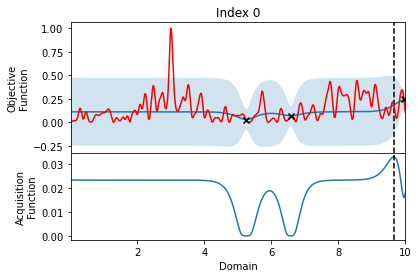

torch.Size([10000, 1])
torch.Size([10000, 1])


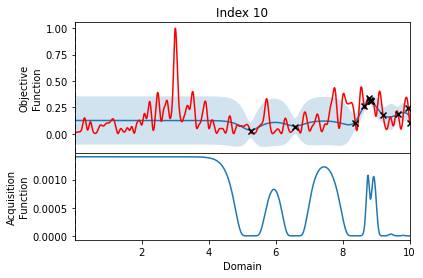

torch.Size([10000, 1])
torch.Size([10000, 1])


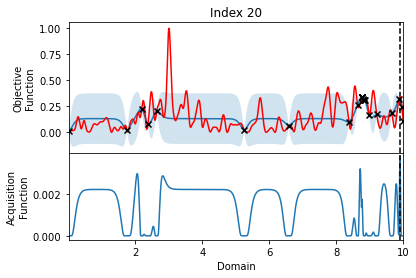

torch.Size([10000, 1])
torch.Size([10000, 1])


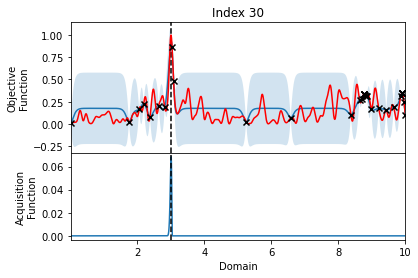

torch.Size([10000, 1])
torch.Size([10000, 1])


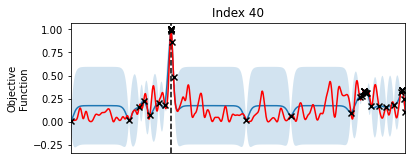

In [20]:
pltr = ResultsPlotter(optimizer._construct_dict(), results)
parameters_to_plot = ["rec_r"]
pltr.plot_training_iterations(
    torch.Tensor(rvec).unsqueeze(-1),
    parameters_to_plot,
    ObjFunc=MatchedFieldProcessor,
    index=[0, 10, 20, 30, 40],
)

### 2-D Localization

In [6]:
fixed_parameters.pop("src_z")
search_parameters = [
    {
        "name": "rec_r",
        "bounds": [3.0, 6.0]
    },
    {
        "name": "src_z",
        "bounds": [1., 200.]
    }
]

In [11]:
config = OptimizerConfig(
    acq_func=ExpectedImprovement,
    acq_func_kwargs={"num_samples": 512},
    n_warmup=3,
    n_total=200
)
optimizer = Optimizer(
    config,
    MatchedFieldProcessor(),
    search_parameters,
    fixed_parameters=fixed_parameters,
    device=DEVICE,
    seed=int("0166511916"),
)

In [12]:
results = optimizer.run()

NameError: name 'K' is not defined

: 

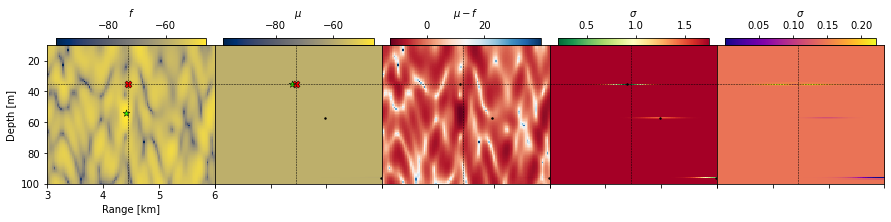

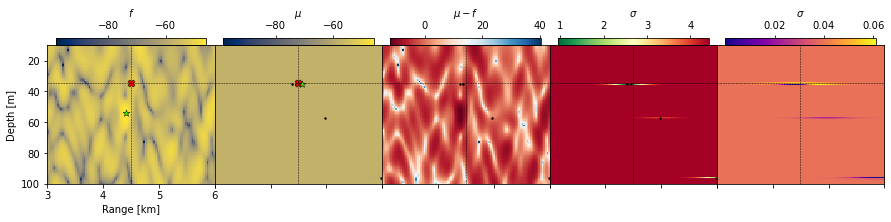

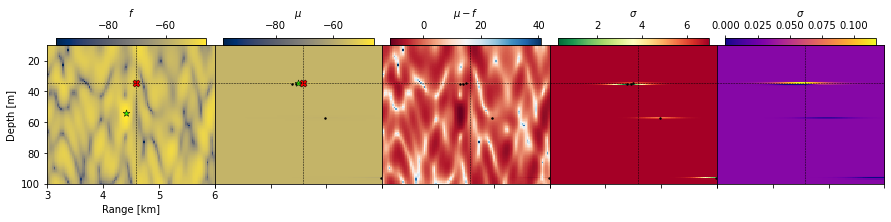

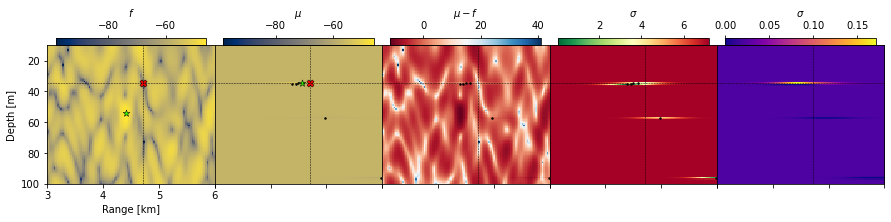

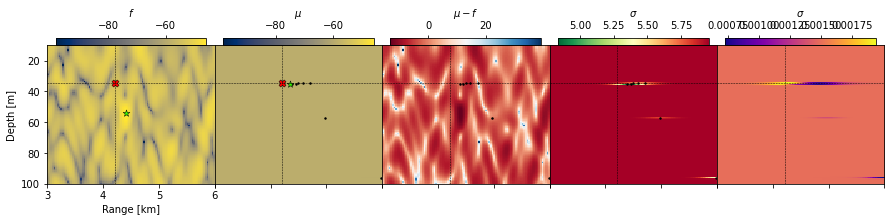

...

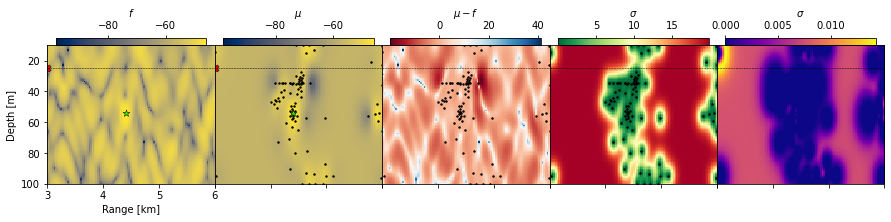

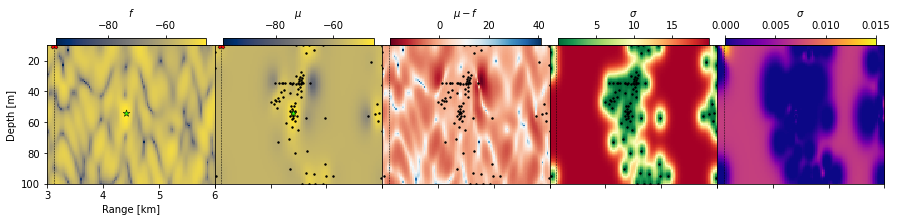

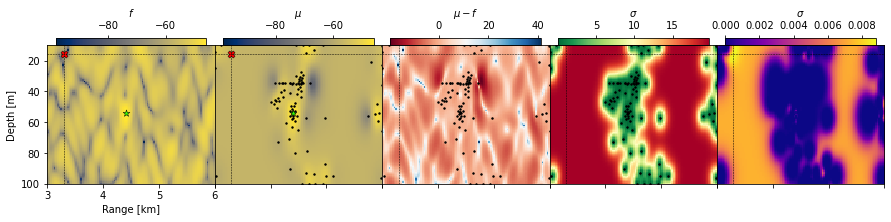

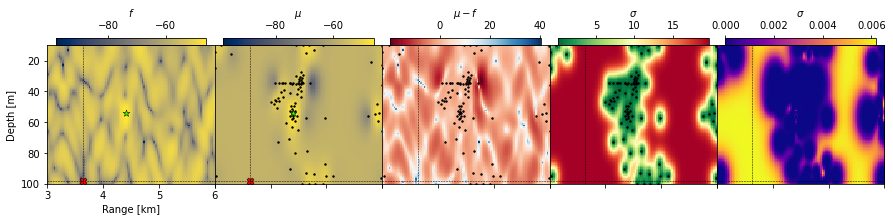

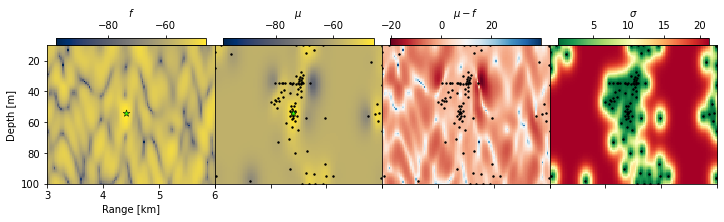

In [18]:
M, N = 101, 101
X_test = torch.cartesian_prod(
    torch.linspace(
        search_parameters[0]["bounds"][0], search_parameters[0]["bounds"][1], M
    ),
    torch.linspace(
        search_parameters[1]["bounds"][0], search_parameters[1]["bounds"][1], N
    )
).unsqueeze(1)

pltr = ResultsPlotter(optimizer._construct_dict(), results)
parameters_to_plot = ["rec_r", "src_z"]
pltr.plot_training_iterations(
    X_test,
    parameters_to_plot,
    ObjFunc=MatchedFieldProcessor,
    M=M,
    N=N,
    # index=[0, 10, 20, 30, 40,  -1],
    parameter_labels=["Range [km]", "Depth [m]"],
    reverse_y=True
)